# Beauty and Bias: A Critical Analysis of Beauty Standards in Machine Learning
#### Michael Sam, Isabella Bossa

The goal of this project is to analyze what drives “attractiveness” in the popular CelebA dataset, understanding how these beauty standards are embedded within and reflected into the field of Machine Learning in general, and performing a critical analysis of results - considering not only the technological but also the societal, cultural and ethical associations and implications of findings.

## Background

Since AlexNet won the ImageNet visual recognition challenge in 2012, convolutional neural networks (in particular) and machine learning (in general) underwent an explosion in popularity so big and influential that our world continues to be reshaped and revolutionized by it. Computers had until then been highly effective with numerical and tabular data but not of much use when it came to image recognition. AlexNet’s incredible success in the 2012 competition, however, turned the standards of the time upside down and paved the way for the future we are living in now: one where computer vision has made such large advances that it has become an important part of our daily lives and a powerful tool in fields ranging from healthcare to marketing to transportation to e-commerce and more.

One of the most popular applications of computer vision is facial recognition which, as its name suggests, works by identifying facial features in an image. It captures, analyzes and compares patterns based on a person’s facial features, and can identify or verify the identity of said person using their face. It has become such a widespread technology that even our phones and laptops now make use of facial recognition. There is much talk about the impact and possible repercussions of facial recognition, but not much attention is usually given to one of the most important aspects behind it: how do the algorithms learn to recognize and identify human faces?

As with the rest of machine learning, it all starts with data. Data - lots of it - needs to be fed into models so that they can be trained and learn the necessary information and patterns. One of the most popular facial recognition datasets is **CelebFaces Attributes (CelebA)**, a large-scale facial attributes dataset with over 200 thousand images with 40 attribute annotations for more than 10 thousand celebrities. The dataset, which is freely available to the public, originated in the Chinese University of Hong Kong in December 2015, and has since been used to train and test models in tasks like facial attribute recognition, facial recognition and detection, facial editing and synthesis.

The 40 attribute annotations in CelebA contain information on the physical characteristics of the image subjects. These annotations convey the presence or absence of specific attributes. Many of these are related to facial and head features, for example “oval face”, “big nose”, “mustache”, or “receding hairline”. Others are regarding “add-ons” like make-up and accessories, such as “wearing hat”, “wearing lipstick”, and “heavy makeup”, yet others, like “smiling” and “mouth slightly open” are about the individual’s expression when the picture was taken. Another category is made of qualifiers about the celebrity in question, with features like “young” and “attractive”. Although the dataset has been (and will probably continue to be) undoubtedly useful, we have a number of concerns about it:

-  Nowhere in the dataset’s webpage or in our Google search were we able to find who made these annotations, when and where they made them, or what criteria were used.
- While a few of the features are objective (such as whether a person is wearing earrings or a hat), the majority are highly subjective. What constitutes a “big” nose or “narrow” eyes? And how are non-obvious cases decided?
- The feature that most intrigued us was, by far, the one regarding attractiveness. What exactly makes a person attractive? This changes from culture to culture, country to country, region to region, and even person to person. Someone who seems attractive to me might not seem attractive to you, and that is okay. However, the dataset presents attractiveness as an objective, hard yes-or-no label.  

While CelebA is, in no way, a perfect representation of the immensity of available data (which, according to Exploding Topics, grows by 328.77 million terabytes every day), the dataset is so popular and widely used for facial recognition tasks, we believe it is a good indicator of the beauty standards in the field of machine learning. Thousands, if not millions, of projects and applications have been trained and optimized using CelebA since the dataset came to light in 2015, and, with each one of these, the subjectivity and biases of whoever labeled the dataset are perpetuated and amplified. 

## Exploratory Data Analysis

In [ ]:
# Import useful libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import missingno as msno
import seaborn as sns
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import cross_val_score, train_test_split, GridSearchCV
from sklearn.model_selection  import train_test_split, cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier 
import graphviz
from IPython.display import display_svg
from IPython.display import Image
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


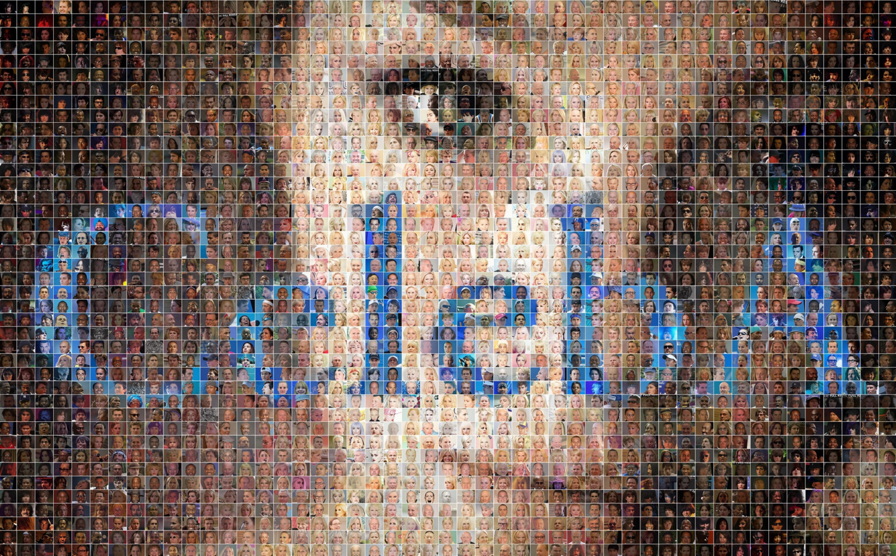

In [ ]:
Image(filename='/content/drive/MyDrive/CS221/images/Imagen1.png',width=700,height=500)

### Dataset Features

CelebA contains 40 feature annotations per image. These annotations convey information of the physical appearance of the celebrities in the dataset, indicating the presence or absence of specific attributes as hard labels.

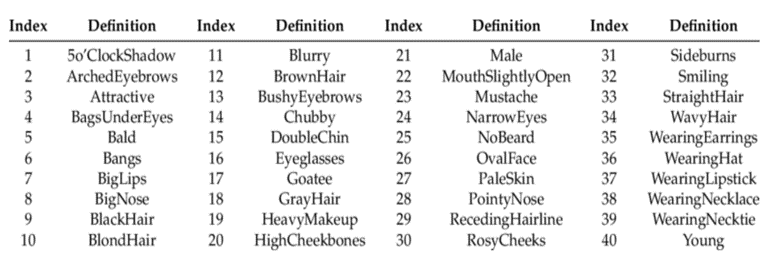

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/CS221/list_attr_celeba.csv")
odf = df.copy()

Image(filename='/content/drive/MyDrive/CS221/images/Imagen2.png',width=900,height=300)

Below are sample images from CelebA. These contain celebrities wearing eyeglasses, with bangs, with a pointy nose, with an oval face, wearing a hat, with wavy hair, with a mustache, and smiling, respectively. 

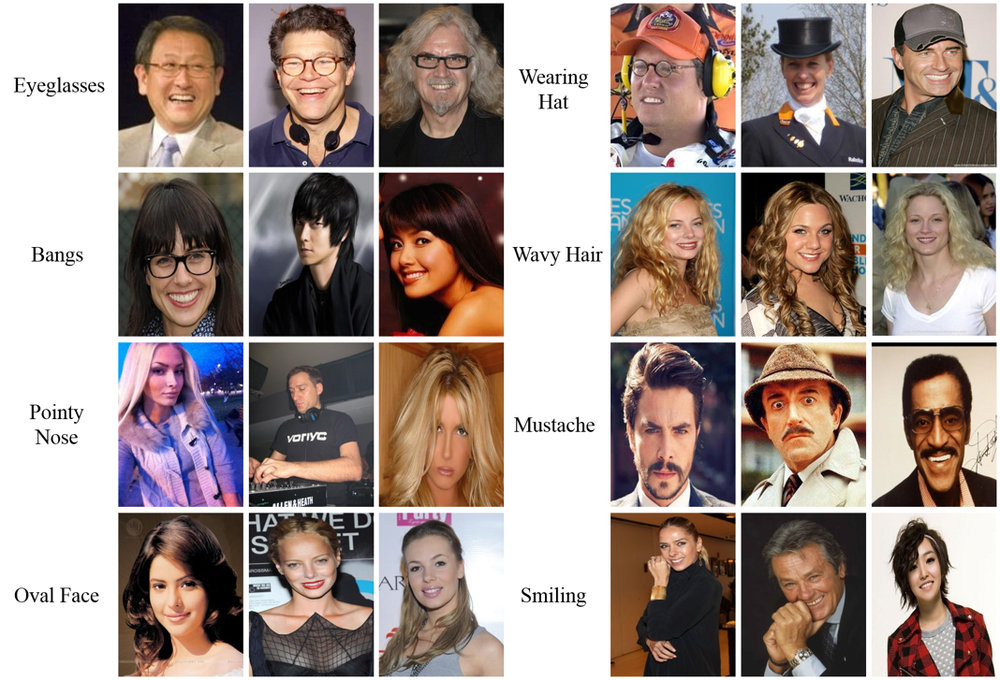

In [ ]:
Image(filename='/content/drive/MyDrive/CS221/images/Imagen5.png',width=900,height=600)

In [ ]:
df.shape[0]
df.shape[1]
print(f"The dataset has {df.shape[0]} rows, {df.shape[1]} variables")

The dataset has 202599 rows, 40 variables


CelevA has no missing data. All 202599 observations and 40 features have a value in the original dataset.

In [ ]:
np.any(df.isna().sum())

False

### Preprocessing
<p align="justify"> We dropped the column "image_id" because it only serves as an identifier for the picture and does not provide any feature that can help us analyze patterns with respect to our variable of interest: "attractiveness". We also replaced the encoding of all the features to 0 (not presenting the feature) and 1 (presenting the feature). Now, our dataset is one-hot-encoded; this will help us run some machine learning algorithms to analyze which features drive "attractiveness".

In [ ]:
df.drop(['image_id'], axis=1, inplace=True)
df = df.replace({-1: 0, 1: 1})
df.head()

,5_o_Clock_Shadow,Arched_Eyebrows,Attractive,Bags_Under_Eyes,Bald,Bangs,Big_Lips,Big_Nose,Black_Hair,Blond_Hair,...,Sideburns,Smiling,Straight_Hair,Wavy_Hair,Wearing_Earrings,Wearing_Hat,Wearing_Lipstick,Wearing_Necklace,Wearing_Necktie,Young
0,0,1,1,0,0,0,0,0,0,0,...,0,1,1,0,1,0,1,0,0,1
1,0,0,0,1,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,1
2,0,0,0,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,1
3,0,0,1,0,0,0,0,0,0,0,...,0,0,1,0,1,0,1,1,0,1
4,0,1,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,1


### Response Variable Analysis

Our response variable is "attractive", which supposedly conveys whether the celebrity in question is attractive or not.

When simpling calculating the proportion of images labeled as "attractive," we found that the dataset is <b>apparently</b> well balanced, as 51.3% of the observations are labeled as such. However, upon further examination in the Critical Analysis section, we will break down these numbers and see that this variable is actually not as balanced as it initially appears.

In [ ]:
attractive_counts = df["Attractive"].value_counts()
attractive_percentages = df["Attractive"].value_counts(normalize=True) * 100

attractive_table = pd.concat([attractive_counts, attractive_percentages], axis=1)
attractive_table.columns = ["Attractive (N)", "Attractive (%)"]
print(attractive_table)

   Attractive (N)  Attractive (%)
1          103833         51.2505
0           98766         48.7495


### Correlation Analysis
We conducted a correlation analysis to identify which features were positively and negatively associated with being deemed attractive in the dataset. We plotted the top 6 features with the highest positive correlation and the top 6 features with the highest negative correlation. Our findings revealed that on the positive correlation side, attributes such as "wearing lipstick" and "heavy makeup" (typically worn by women) were leading, followed by being young, and some facial features such as "arched eyebrows", "pointy nose", and "wavy hair". On the negative correlation side, we observed that the top negatively correlated feature was, interestingly, being "male", along with add-ons like "eyeglasses" and certain facial and body features like "big nose", "chubby", "double chin", and "grey hair".

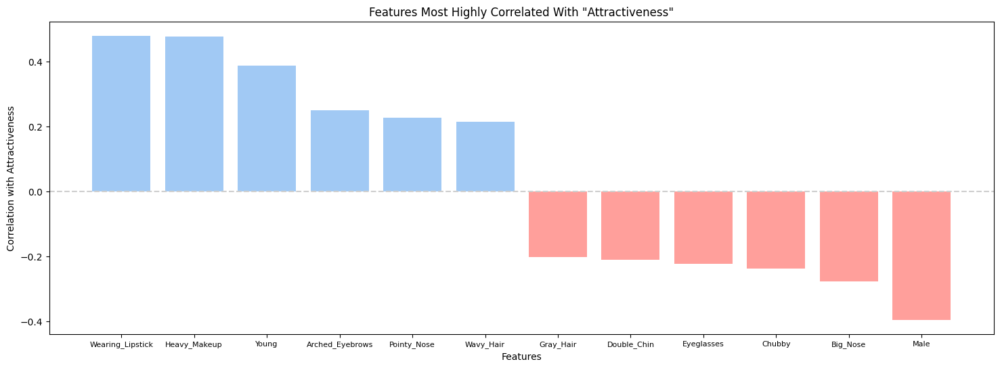

In [ ]:
correlations = df.corr()["Attractive"].sort_values(ascending=False)
cor = correlations[correlations != 1]
big_cor = cor[(cor > 0.2)  | (cor < -0.2)]
big_cor
cor_color = [('#a1c9f4' if c > 0.2 else '#ff9f9b') for c in cor]
fig, ax = plt.subplots(1, 1, figsize = (18, 6)) 
ax.bar(big_cor.index, big_cor, color=cor_color)
plt.xticks(fontsize=8, rotation=0)
ax.set_title('Features Most Highly Correlated With "Attractiveness"')
ax.set_ylabel(f'Correlation with Attractiveness')
ax.set_xlabel('Features')
ax.axhline(0, color="#cfcfcf", linestyle="--");

## Models and Results

We applied machine learning models to determine the factors driving "attractiveness" according to CelebA. For this purpose, we used "attractiveness" as our response variable and all other 39 features as our predictors. As "attractiveness" is encoded as a binary variable, we are dealing with a binary classification task. 

To analyze and understand the driving factors behind attractiveness, we selected two straightforward and, most importantly, interpretable algorithms: a binary logistic regression and a single decision tree.

In [ ]:
# Define train and test sets
X = df[df.columns.difference(["Attractive"])] 
y = df["Attractive"]
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=0)

### Logistic Regression

The advantage of using logistic regression is that its output is a model with interpretable coefficients that have statistical meaning. After running the model, we achieved a high train and test accuracy of around 80%.

In [ ]:
# model
logit = LogisticRegression(penalty="none", random_state=42)
logit.fit(X_train, y_train)

acc_train_logit = logit.score(X_train, y_train)
acc_test_logit = logit.score(X_test, y_test)

print(f"Train Accuracy: {round(acc_train_logit * 100, 2)}%")
print(f"Test Accuracy: {round(acc_test_logit * 100, 2)}%")

y_pred_test_proba = logit.predict_proba(X_test)[:, 1]

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(


Train Accuracy: 78.62%
Test Accuracy: 78.93%


In order to gain deeper insights into the model, we performed a feature importance analysis on the predictors. We then calculated the change in odds from the coefficients of the logistic regression model.

In [ ]:
# feature importance
top = pd.DataFrame(list(zip(logit.coef_.tolist()[0], X_train.columns)),
    columns=["Coeffient Value", "Feature"])
top["Odds Change"] = np.exp(top["Coeffient Value"])
top = top.sort_values(by="Coeffient Value", ascending=False).head(6)

bottom = pd.DataFrame(list(zip(logit.coef_.tolist()[0], X_train.columns)),
    columns=["Coeffient Value", "Feature"])
bottom["Odds Change"] = np.exp(bottom["Coeffient Value"])
bottom = bottom.sort_values(by="Coeffient Value", ascending=False).tail(6)

In the tables below, we present the top 6 features with the highest change in odds and the top 6 features with the lowest change in odds. We observed that the top features that positively contribute to classifying someone as attractive are being young, wearing lipstick and heavy makeup, smiling, having pale skin and bushy eyebrows. On the other hand, the top features that negatively contribute to classifying someone as attractive are the person in question being chubby or the image being blurry, followed by having grey hair, being bald, having double chin, and wearing eyeglasses. It is interesting to note that many of these features were also present in the correlation analysis.

In [ ]:
print("Top Positive Features:")
print()
top

Top Positive Features:



,Coeffient Value,Feature,Odds Change
38,1.507446,Young,4.515184
35,0.975946,Wearing_Lipstick,2.653675
17,0.908068,Heavy_Makeup,2.479527
30,0.890775,Smiling,2.437018
25,0.854756,Pale_Skin,2.350800
11,0.574820,Bushy_Eyebrows,1.776810


In [ ]:
print("Top Negative Features:")
print()
bottom

Top Negative Features:



,Coeffient Value,Feature,Odds Change
14,-1.070046,Eyeglasses,0.342993
13,-1.081454,Double_Chin,0.339102
3,-1.388431,Bald,0.249466
16,-1.441333,Gray_Hair,0.236612
9,-1.621832,Blurry,0.197537
12,-1.761004,Chubby,0.171872


For the purpose of illustrating the interpretation of the model, we can say that based on the logistic regression analysis, an individual who is "young" has 351% higher odds of being classified as "attractive" compared to an individual who is "not young". Conversely, according to the model, an individual who is "chubby" has 83% lower odds of being classified as "attractive" compared to an individual who is "not chubby".

### Decision Tree

We also ran a decision tree, as it is another interpretable model that determines who is "attractive" based on decision rules. After running the model, we also obtained a high train and test accuracy of around 80% and performed a feature importance analysis on the predictors. In a decision tree, a high feature importance means that the predictor is relevant in helping to classify the person as "attractive" or not, and the feature is present at the top of the tree.

In [ ]:
# with cross-validation
hparameters_dt = {'splitter': ['best', 'random'],
                'max_depth' : [8,10,12],
                'random_state': [42]}

dec_tree = DecisionTreeClassifier()
dt_grid = GridSearchCV(dec_tree, param_grid=hparameters_dt, scoring='accuracy', 
    cv=5, verbose=False, n_jobs=-1)
dt_grid.fit(X_train, y_train)
# print("Best parameters:")
# print(dt_grid.best_params_)

y_train_accuracy = dt_grid.best_estimator_.score(X_train, y_train)
y_test_accuracy = dt_grid.best_estimator_.score(X_test, y_test)
y_pred_test_proba = dt_grid.predict_proba(X_test)[:,1]
y_pred_train_proba = dt_grid.predict_proba(X_train)[:, 1]

print(f"Train Accuracy: {round(y_train_accuracy * 100, 2)}%")
print(f"Test Accuracy: {round(y_test_accuracy * 100, 2)}%")

Train Accuracy: 79.36%
Test Accuracy: 78.07%


In the table, we have ranked the most important variables in descending order of feature importance. Wearing lipstick, young, heavy makeup, blurry, bushy eyebrows, chubby, smiling, and big nose are the most significant features in classifying someone as attractive or unattractive. Interestingly, many of these features were also observed in our correlation analysis and logistic regression model.

In [ ]:
# feature importance
dt_feat = pd.DataFrame(list(zip(X_train.columns, dt_grid.best_estimator_.feature_importances_)), 
    columns=["Feature", "Importance"])
dt_feat.sort_values(by="Importance", ascending=False).head(10)

,Feature,Importance
35,Wearing_Lipstick,0.519527
38,Young,0.175710
17,Heavy_Makeup,0.037989
9,Blurry,0.025677
11,Bushy_Eyebrows,0.022301
12,Chubby,0.021708
30,Smiling,0.019670
6,Big_Nose,0.019415
26,Pointy_Nose,0.019012
20,Mouth_Slightly_Open,0.016476


We also examined the first few branches of decision trees and interpreted the results. According to the model:

- Someone who wears lipstick and is young is classified as attractive.
- Someone who wears lipstick but is not young is classified as unattractive.
- Someone who does not wear lipstick and is not young is classified as unattractive.
- Someone who does not wear lipstick, but is young and has bushy eyebrows is classified as attractive.

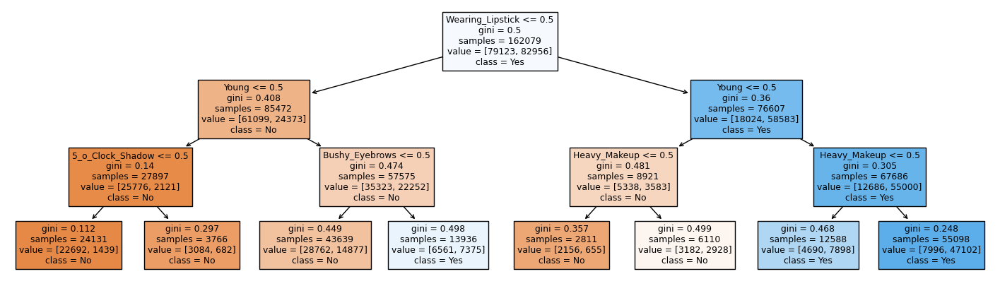

In [ ]:
# visualize "shorter" version of decision tree
dt_best_short = DecisionTreeClassifier(max_depth=3, random_state= 42, splitter="best")
dt_best_short.fit(X_train, y_train)

fig = plt.figure(figsize=(18,5))
tree.plot_tree(dt_best_short, 
              feature_names=X_train.columns,  
                class_names=["No", "Yes"],
                filled=True)
plt.show()

### Results Summary
We can see that both the logistic regression and the decision treee were reasonably good since they have a relatively high accuracy (~80%) and do not appear to be overfitting as the training and testing accuracies are comparable. Additionally, the feature importance of the predictors shows a significant degree of overlap between the two models. However, it is important to examine the ethical, cultural, and societal implications of these results, which will be discussed further in the next section.

## Critical Analysis

### What Is Attractiveness?

While there is no universal concensus on what exactly classifies as "attractive", we wanted to start by exploring some of the definitions of attractiveness by popular dictionaries and web sources.

**Oxford Dictionary**
1. The quality of being pleasant to look at or experience
2. The quality of seeming interesting or worth having

**Cambridge Dictionary**
1. The quality of being very pleasing in appearance or sound
2. The quality of causing interest or making people want to do something

**Wikipedia**

<p align="justify"> Physical attractiveness is the degree to which a person's physical features are considered aesthetically pleasing or beautiful. The term often implies sexual attractiveness or desirability, but can also be distinct from either. There are many factors which influence one person's attraction to another, with physical aspects being one of them. Physical attraction itself includes universal perceptions common to all human cultures such as facial symmetry, sociocultural dependent attributes and personal preferences unique to a particular individual.

**ChatGPT**

<p align="justify"> Attractiveness is a subjective perception of physical or behavioral characteristics that are pleasing or appealing to others. It refers to the ability of a person or thing to evoke interest, admiration, or desire in others, based on their perceived physical features, personality traits, or behavior. 

<p align="justify"> Physical attractiveness is often associated with qualities such as facial symmetry, youthfulness, body shape, and overall grooming and hygiene. However, other factors such as confidence, charisma, sense of humor, intelligence, and kindness can also contribute to a person's perceived attractiveness. 

<p align="justify"> It's important to note that attractiveness is subjective and varies across cultures, individuals, and contexts. What one person finds attractive may not necessarily be the same for another person.

#### What Does Attractiveness Mean?

<p align="justify"> Even though there is no correct answer for such a complex question, to establish a better understanding, we have consulted four reputable sources: two formal definitions from trusted dictionaries (Oxford and Cambridge), an article from the widely used online encyclopedia (Wikipedia), and a response from a popular generative/conversational AI (ChatGPT). However, it is important to note that the definitions we have gathered come with some caveats: the definitions from Oxford and Cambridge were specifically for the word "attractiveness", while the definition from Wikipedia focused on "physical attractiveness" as there was no specific article titled "attractiveness". Lastly, the definition from ChatGPT was derived from the question asked: "What is attractiveness?".

- <p align="justify"> We can note that the definitions provided by Oxford and Cambridge are notably similar. They are concise and lack elaboration on the dimensions or traits that contribute to attractiveness. Both define attractiveness as a quality that generates positive responses from individuals based on visual appearance, behavior, or characteristics. The first definition in each dictionary emphasizes visual appeal, while the second is centered around the ability to arouse interest or attraction in people, which can include non-physical attributes such as intelligence, confidence, or social status.

- <p align="justify"> Regarding Wikipedia's definition, we can say that physical attractiveness refers to the degree to which a person's physical features are considered aesthetically pleasing or beautiful. It can be associated with sexual desirability but is not limited to it. Its definition is more comprehensive and asserts criteria like:

  1. Universal perceptions common to all cultures. For example, facial symmetry  - which can be objectively measured using mathematical models like the golden ratio.
  2. Sociocultural attributes, which vary depending on the culture or region.
  3. Personal preferences, which introduces a subjective component to the perception of a person's attractiveness.

- <p align="justify"> Finally, we think that the definition provided by ChatGPT is also very comprehensive. It acknowledges that attractiveness is a subjective perception of physical or behavioral traits that are considered pleasing or appealing to others. Interestingly, ChatGPT highlights specific physical characteristics that are commonly associated with attractiveness, such as facial symmetry, youthfulness, body shape, grooming, and hygiene (while these features have some degree of objectivity, they are still hard to measure). However, it also covers specific non-physical attributes associated to being attractive like confidence, charisma, sense of humor, intelligence, and kindness. It is important to note that ChatGPT emphasizes that attractiveness is culturally and contextually dependent, as well as being unique to each individual.

<p align="justify"> According to these definitions, it is generally agreed that attractiveness is a subjective concept that depends on factors such as culture, personal preferences, and personality. However, there is also a physical dimension associated with it. CelebA, however, labels all images with a hard Yes/No label fixing a "ground truth", without even specifying the criteria used to determine them.

#### The Golden Ratio of Beauty

<p align="justify"> Both Wikipedia and ChatGPT note that attractiveness is often associated physical characteristics such as facial symmetry, with the golden ratio (1.618) being the most widely used metric. While the concept of the golden ratio is attributed to ancient Greeks, specifically mathematician Euclid and philosopher Pythagoras, the specific idea of a "Golden Ratio Face" or a set of facial proportions based on the golden ratio is a modern concept. This concept has gained significant influence in the field of plastic surgery, where it is often used as a guide to "objectively" assess and improve a person's facial symmetry and overall attractiveness. Over time, it has been popularized in various forms by artists, scientists, and cosmetic surgeons.

Some of the proportions outlined by the Golden Ratio, are:

- <p align="justify">A visually balanced face is about 1.618 times longer than it is wide.
- <p align="justify">The distance from the top of the nose to the center of the lips should be around 1.618 times the distance from the center of the lips to the chin.
- <p align="justify">The distance from the hairline to the upper eyelid is 1.618 times the length of the top of the upper eyebrow to the lower eyelid.
- <p align="justify">The model ratio of volume in the lips is 1:1.618, with the lower lip having slightly more volume than the upper lip.
- <p align="justify">The length of an ear should be similar to the length of the nose.
- <p align="justify">The width of an eye should be similar to the distance between the eyes.

However, we should note the implications of this concept:
- <p align="justify">The Golden Ratio of beauty focuses solely on physical features, which are just one component of attractiveness. As previously discussed, attractiveness comprises many other dimensions. Therefore, reducing the concept of attractiveness to a specific set of physical features based on a mathematical formula may be limiting.

- <p align="justify">The concept of the Golden Ratio is rooted in Western culture, and its application as a universal standard of beauty is culturally biased. People from other regions may have different facial proportions that are not reflected in the Golden Ratio, and this shouldn't imply that they are not attractive.

- <p align="justify">Finally, using this metric to assess attractiveness can perpetuate the idea that there is a "universal standard of beauty" that can be achieved through plastic surgery, which can have negative consequences for an individual's mental health and self-esteem.


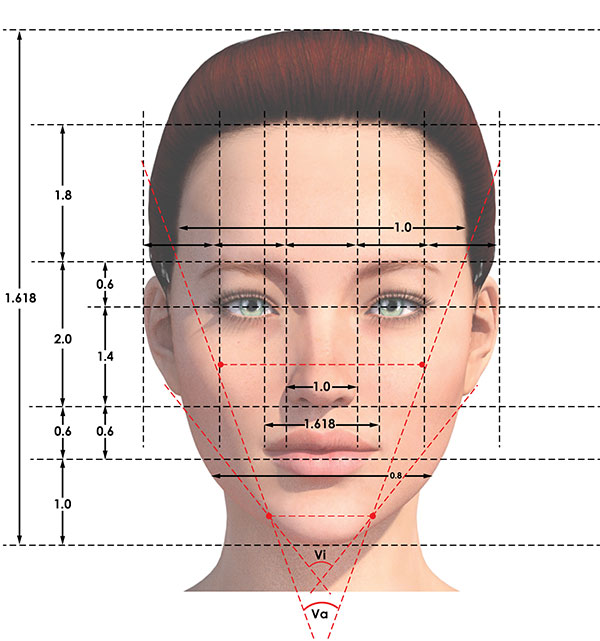

In [ ]:
Image(filename='/content/drive/MyDrive/CS221/images/Imagen4.jpg',width=600,height=600)

### Analysis of Machine Learning Models Results

#### Correlation Results

When examining the results from our correlation analysis, we observed that there is a marked difference between the kinds of images that are labeled as attractived and the ones that are not.

To perform a visual inspection, we first randomly sampled images that contained the 5 most positively correlated features with attractiveness. We noticed the pictures we obtained all contained celebrities with several things in common:
- They were all women.
- They all had Eurocentric features (arched eyebrows, pointy nose, light skin tone).
- They were all young.
- They also seemed very stylish (wearing heavy makeup and lipstick, jewelry and accessories, and with polished hairstyles).

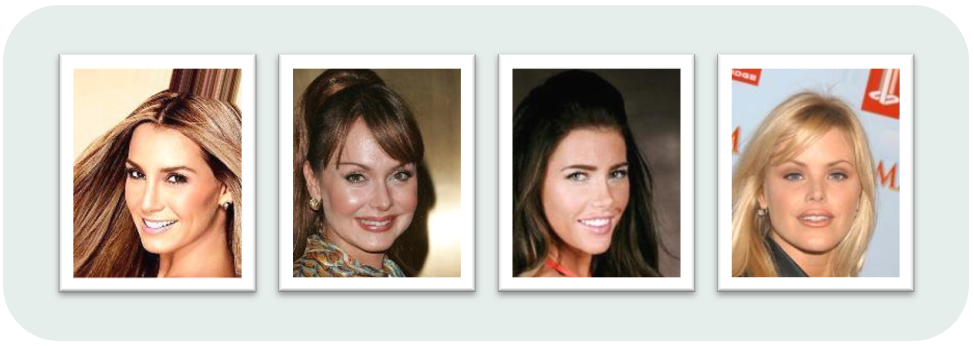

In [ ]:
Image(filename='/content/drive/MyDrive/CS221/images/pic_correlation_positive.PNG',width=800,height=300)

We then also randomly sampled images containing the 5 most negatively correlated features with the response variable, and obtained very different results. In this case, all celebrities were men (being male was one of the top 5 most negatively correlated features with attractiveness). Moreover, although being young was not one of the "top 5" features, every subject in our sample seemed to be older than 50 or 60 years old.

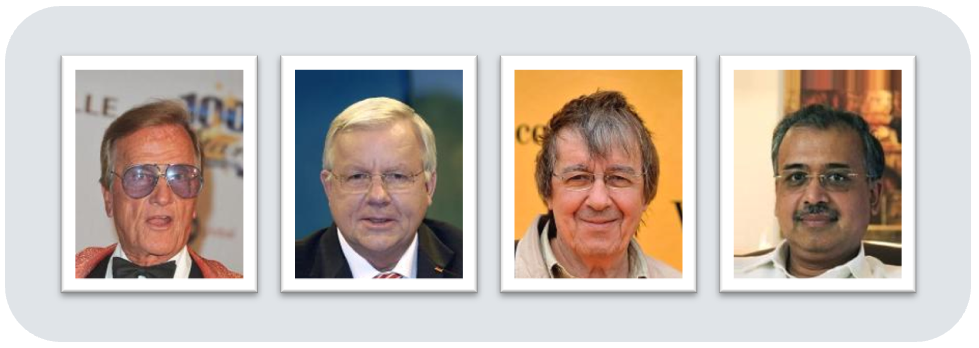

In [ ]:
Image(filename='/content/drive/MyDrive/CS221/images/pic_correlation_negative.PNG',width=800,height=300)

#### Logistic Regression Results

We followed the same procedure for our logistic regression model and obtained very similar results. Noce that a pattern starts to emerge: once again, the celebrities deemed attractive are all young, female, European-looking and stylish, while those classified as not attractive are all older men.

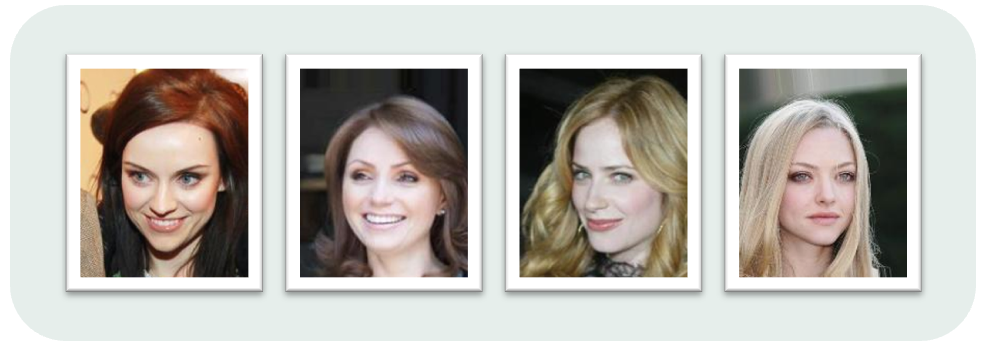

In [ ]:
Image(filename='/content/drive/MyDrive/CS221/images/pic_log_positive.PNG',width=800,height=300)

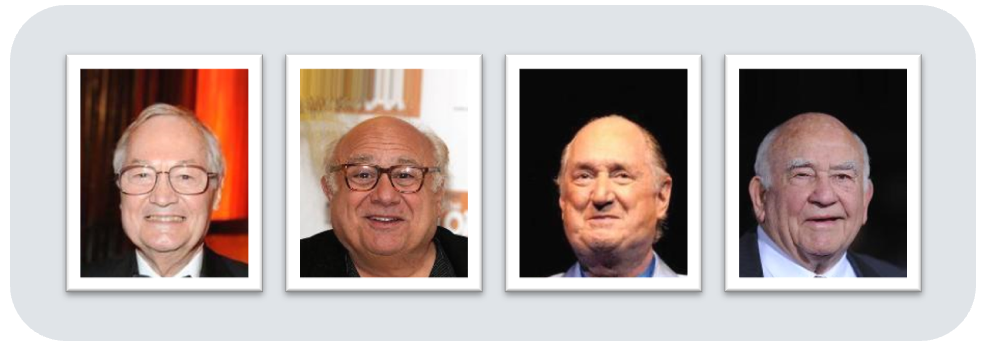

In [ ]:
Image(filename='/content/drive/MyDrive/CS221/images/pic_log_negative.PNG',width=800,height=300)

We found three additional potentially problematic issues:
- There is very little racial and ethnic diversity in CelebA, especially for the "attractive" images. For instance, seven of the eight images of men we sampled contained white men, while, for the opposite gender, every single picture depicted a white, European-looking woman.
- We kept on getting men when randomply sampling images with the top 5 negative predictors (being bald, chubby, with a double chin and grey hair and wearing glasses), which made us wonder whether there were any women with such characteristics. Since it is far more common for men to be bald, we decided to skip this one feature and investigate how many images there were of (1) chubby, (2) double-chinned, (3) grey-haired, (4) glass-wearing celebrities. In the end, we found that although there were 452 men with these characteristics, there were only 5 such women. This, to us, was very telling of the representation (or lack thereof) of certain groups in the dataset, and implies that women with certain characteristics are very poorly represented in CelebA.
- Although wearing glasses is one of the top 5 negative predictors of attractiveness, we noticed that two of the four randomly sampled images (the rightmost ones) do **not** contain glasses. This raises many concerns about the objectivity and accuracy of the dataset. Wearing glasses is one of the few truly objective metrics (either a person is wearing glasses or she is not), yet even for this feature, some of the labels are incorrect. 

#### Decision Tree Results

Our decision tree results were very similar to those from the correlation and logistic regression analyses: the two most important features when predicting attractiveness were being young and wearing makeup. 

Since randomply sampling images with these features gave us very similar samples to those obtained earlier, we decided to tackle this analysis from a different angle.

First, we sampled images that contained women who were young and wearing makeup yet were deemed non-attractive. The was the first time we got pictures of non-white, non-European looking celebrities. 

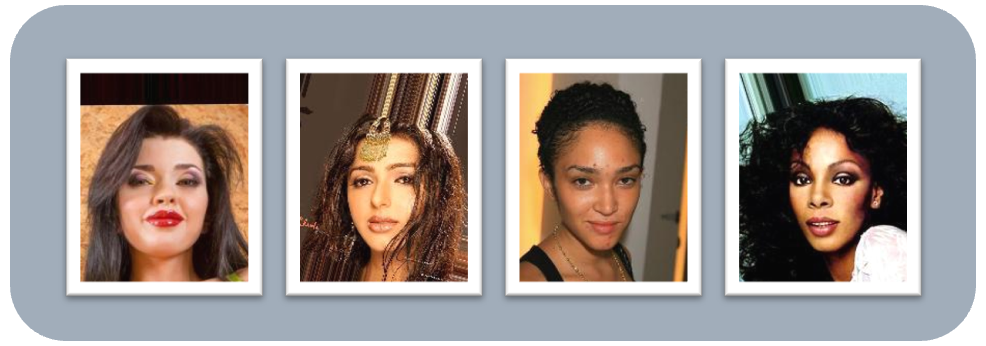

In [ ]:
Image(filename='/content/drive/MyDrive/CS221/images/pic_dt_female.PNG',width=800,height=300)

We then followed a similar procedure for men. However, since men do not generally wear makeup, we simply sampled images of young men considered non-attractive by CelebA.

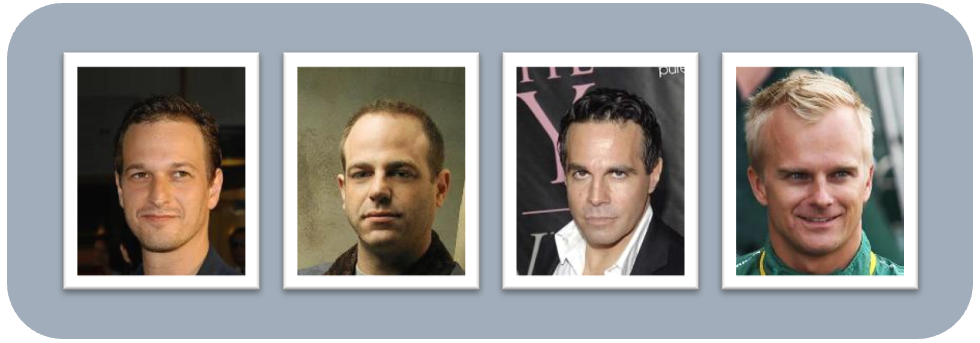

In [ ]:
Image(filename='/content/drive/MyDrive/CS221/images/pic_dt_male.PNG',width=800,height=300)

Our findings added a few potential issues to the growing list of concerns we were keeping track of:
- It was intriguing, to say the least, that the first time we obtained pictures of brown and black women was when sampling for non-attractive celebrities.
- For us, many of the "non-attractive" men and women in our sample are actually very good-looking (and a quick Google searched confirmed many more around the world think similarly), which raised many questions on who exactly labeled this dataset and what criteria were used to classify celebrities as attractive or not.

### Potential Issues and Biases

Overall, we found a large number of potential biases and issues with CelebA and its handling and lack of transparency with the feature annotations. The first bias that caught our attention, and arguably the most salient one, was a gender bias. 

#### Gender Bias

While almost 68% of the women in CelebA are classified as attractive, 72% of men are deemed non-attractive. The proportions for attractiveness are therefore basically reversed between the two genders, dispelling our initial assumptions of a "balanced" dataset.

While we do not know the reason behind this disparity, we have two primary hypothesis:
- Could these results be a reflection of the entertainment industry where, to make it as a woman, you usually need to be young and attractive?
- Could this be a form of negative stereotype against men? 

Independently of the underlying reason for this imbalance in CelebA, the results shed light on the harmful gender stereotypes and objectification of women present in our society and now reflected on machine learning datasets.

In [ ]:
pd.options.mode.chained_assignment = None
df_temp = df[["Attractive", "Male", "Wavy_Hair"]]
df_temp["Male"] = df["Male"].replace({0:"Female", 1:"Male"})
df_temp["Attractive"] = df["Attractive"].replace({0:"No", 1:"Yes"})
df_temp.rename(columns={"Wavy_Hair": "Count", "Male": "Gender"}, inplace=True)
df_temp.groupby(["Gender", "Attractive"]).count().reset_index()
# pd.options.mode.chained_assignment = "warn"

,Gender,Attractive,Count
0,Female,No,37911
1,Female,Yes,80254
2,Male,No,60855
3,Male,Yes,23579


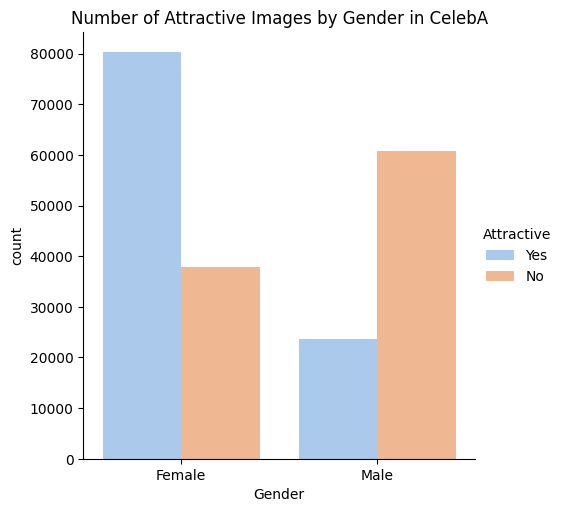

In [ ]:
sns.catplot(x="Gender", hue="Attractive", kind="count", data=df_temp, palette="pastel")
plt.title("Number of Attractive Images by Gender in CelebA");

#### Age Bias

The second issue we observed was an age bias. CelebA classifies almost 62% of young people as attractive, yet it also labels the large majority (nearly 85)% of older people as non-attractive.

These results could also be the reflection of damaging stereotypes that suggest we lose our attractiveness as we age. Once again, the harmful beauty standards, ageism, social exclusion of older adults, and biased belief that a person's beauty is based on his youthfulness ever-present in our society are being perpetuated by our datasets.

In [ ]:
pd.options.mode.chained_assignment = None
df_temp = df[["Attractive", "Young", "Wavy_Hair"]]
df_temp[["Attractive", "Young"]] = df[["Attractive", "Young"]].replace({0:"No", 1:"Yes"})
df_temp.rename(columns={"Wavy_Hair": "Count"}, inplace=True)
df_temp.groupby(["Young", "Attractive"]).count().reset_index()

,Young,Attractive,Count
0,No,No,38791
1,No,Yes,7074
2,Yes,No,59975
3,Yes,Yes,96759


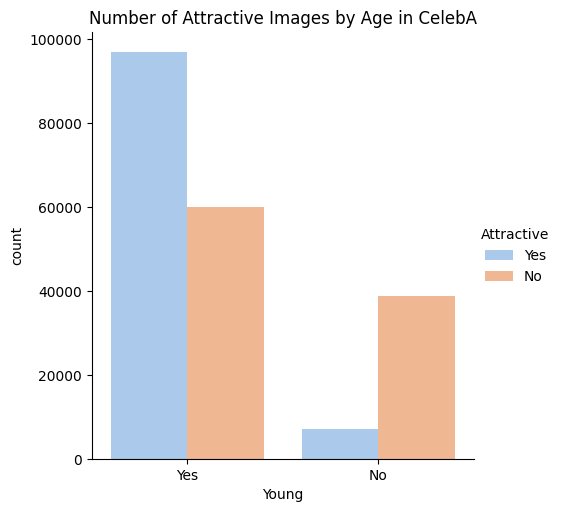

In [ ]:
sns.catplot(x="Young", hue="Attractive", kind="count", data=df_temp, palette="pastel")
plt.title("Number of Attractive Images by Age in CelebA");

#### Lack of Diversity

Many of our previous findings strongly suggested CelebA suffered from a lack of diversity. As a litmus test to check this assumption, we searched "cultural diversity" on Google. The set of images below is one of the first results that came up. 

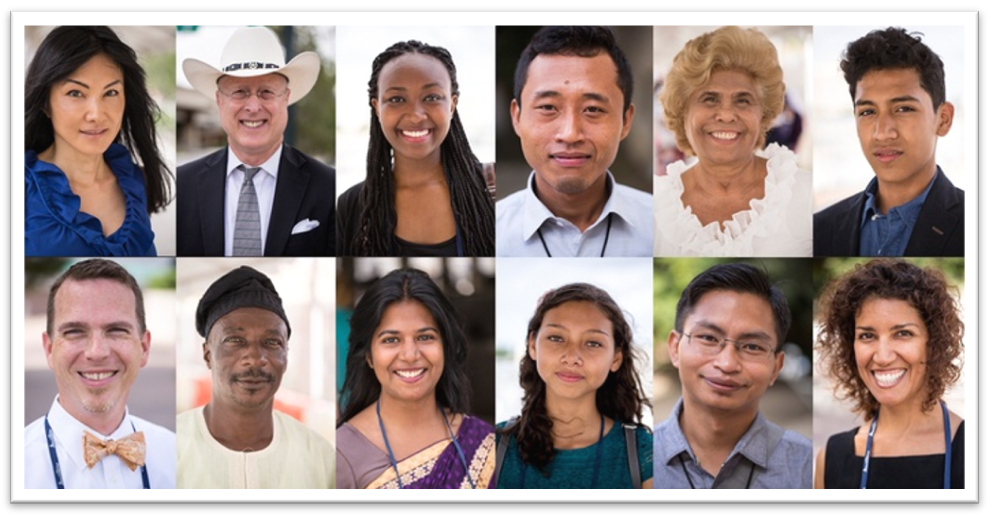

In [ ]:
Image(filename='/content/drive/MyDrive/CS221/images/diversity_google.PNG',width=800,height=450)

We then compared the Google results with CelebA. To do this, we randomply sampled 10 images from the entire dataset, shown below. 

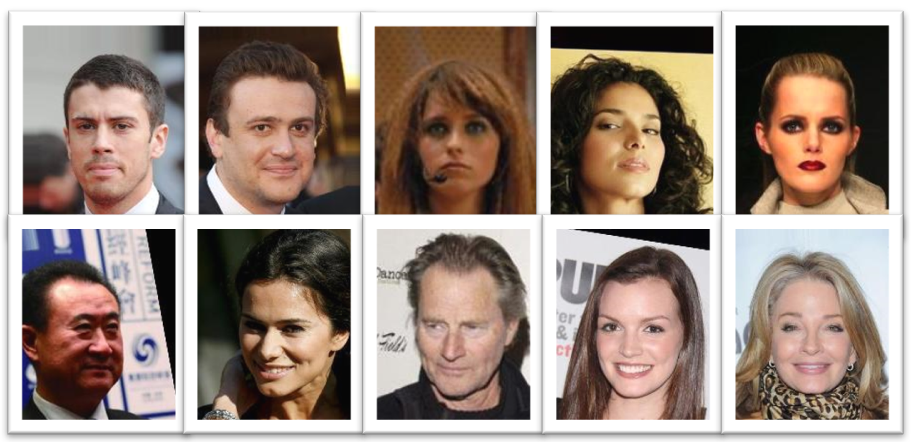

In [ ]:
Image(filename='/content/drive/MyDrive/CS221/images/diversity_celebA.PNG',width=700,height=300)

The difference between the two set of images is apparent: the top one contains  more ethnicities, races, dressing- and hair-styles, and is just more diverse in general.

#### Cultural Bias

The following three images depict, respectively (top to bottom, left to right):
1. Native Wayuu women from the region around La Guajira desert in Colombia.
2. A "palenquera", a woman wearing a traditional dress and balancing a bowl of tropical fruit and produce (for sale) on her head. The outfit is deeply rooted in the history and tradition of the descendants of African slaves in Cartagena, Colombia.
3. An indigenous woman from the Brazilian Amazon.

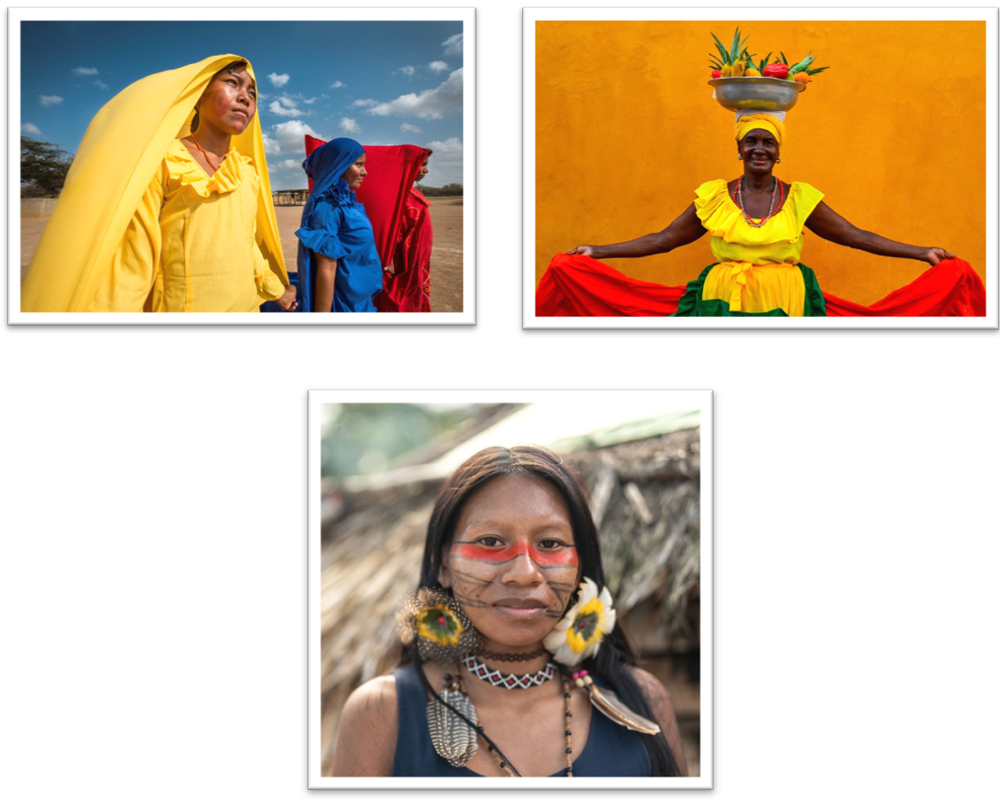

In [ ]:
Image(filename='/content/drive/MyDrive/CS221/images/cultural_bias.PNG',width=600,height=400)

We couldn't help but notice that members of certain ethnic and cultural groups, like the six women in the images above, were nowhere to be found in CelebA. 

This suggests, yet again, that CelebA does not represent - and in fact leaves out - large groups of society. This is particularly harmful for underrepresented groups and minorities, and further perpetuates the cycle of marginalization and exclusion present for centuries in our civilization. 

### Conclusion

Ironically, CelebA is described all throughout the internet as having "large diversities", a claim that is simply not true. 

In fact, CelebA underrepresents or outright excludes large segments of the population. This is especially problematic when considering the popularity of the dataset. In fact, CelebA has been used in over 2 thousand papers since 2019, and continues to be a widely used in software and technology involving facial recognition, detection, manipulation, editing and synthesis, image generation and manipulation, and computer vision in general. Just to put things into perspectives, let us consider two examples:
- If sofware trained on CelebA "sees" a chubby woman with double chin and grey hair who wears glasses, will it know what to do with her? Despite being trained on over 200 thousand images, the algorithm will have seen only 4 women with the 4 aforementioned characteristics, deeming it very unlikely that it has properly "learned" how correctly handle underrepresented subsets of the population like this one.
- It is even more unlikely that a software trained on CelebA will know what to do if it "sees", for instance, an indigenous woman native from the Amazon. Such an algorithm will have never been exposed to anyone who looks even similar, and will thus have no idea what to do.

These are just two out of many possible examples that highlight how problematic the lack of diversity and representation in CelebA is. Algorithms trained on such biased datasets not just perpetuate but also amplify harmful societal stereotypes.

Additionally, CelebA contains objectively incorrect labels even with features that leave no room for subjectivity (like wearing glasses). This is even more problematic when taking into account the fact that, with over 200 thousand images and 40 features per image, anyone wanting to manually inspect the labels in CelebA would have to examine more than 8 million annotations. This is realistically not possible for any human individual or team, and therefore, it is almost certain that most researchers and developers using CelebA simply trust that the labels are accurate. 

As previously stated, CelebA is primarily used in facial recognition and computer vision tasks. Due to the complexity involved, most of the algorithms currently employed to perform such tasks are non-interpretable, meaning it is difficult (and sometimes impossible) to understand the logic driving the algorithm or why it reaches the conclusions it does. 

What happens when we use a biased, incorrectly-labeled dataset that underrepresents and excludes large segments of the population and perpetuates and amplifies societal stereotypes and biases? The answer is surely not a positive one. The many biases present in CelebA drive algorithms trained on the dataset to discriminate against and exclude multiple groups of society, affecting many groups including but not limited to women, men, older people, non-white looking people, minorities and marginalized groups. For instance:
- Beauty standards prioritizing a Eurocentric and feminine ideal can lead to harmful biases against individuals who do not fit these narrow definitions.
- The lack of racial and ethnic diversity in the dataset, along with the overrepresentation of certain subsets of the population, implies an exclusion of other groups, leading to further discrimination and marginalization.
- Unrealistic beauty standards like the ones present in CelebA can contribute to body shaming and unrealistic expectations, and even cause physical or mental health issues for many.
- The incorrect annotations in some images may lead to inaccurate conclusions.
- Our results raise grave concerns about the accuracy and reliability of facial recognition technology trained on CelebA, as it may produce incorrect results when used on individuals from underrepresented groups.
- The use of such biased datasets in facial recognition technology can lead to discriminatory practices, particularly in law enforcement and surveillance. 

Overall, our entire analysis sheds light on the long way we still have to go and how much more care we need to put into the data that we gather, the labels that we use, the datasets that we build, and the way we train our models. As a society, we must recognize and challenge these biases, work towards promoting more diverse and inclusive datasets, and develop ethical and culturally sensitive methods for data collection and analyses that do not perpetuate harmful stereotypes and discrimination against any group. Furthermore, we must be mindful of the unintended consequences of technology, particularly in areas where there is a risk of exacerbating existing inequalities and injustices. There is much work - and critical analysis, to be done if we ever want to have less biased and objectively better and fairer datasets and algorithms.